<a href="https://colab.research.google.com/github/Dieg0Bri/AvancesProyectoImagenes/blob/main/ProyectoIMAGENES_Entrega_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from numpy.linalg import norm
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import logging
import numpy as np
import torch
from PIL import Image
from functools import lru_cache
from functools import partial
from itertools import repeat
from multiprocessing import Pool
from os import listdir
from os.path import splitext, isfile, join
from pathlib import Path
from torch.utils.data import Dataset
from tqdm import tqdm

#DATASET IMPORT

Descargar el MineApple Dataset

In [2]:
import os
import tarfile
import urllib.request

# URL del archivo comprimido
url = "https://conservancy.umn.edu/bitstream/handle/11299/206575/detection.tar.gz?sequence=2&isAllowed=y"
file_name = "detection.tar.gz"

# Descargar el archivo
urllib.request.urlretrieve(url, file_name)
if not os.path.isfile(file_name):
    print("No se pudo descargar el archivo")
    exit()
# Descomprimir el archivo
with tarfile.open(file_name, "r:gz") as tar:
    print("descomprimiendo")

    tar.extractall()

descomprimiendo


In [4]:

def load_image(filename):
    ext = splitext(filename)[1]
    if ext == '.npy':
        return Image.fromarray(np.load(filename))
    elif ext in ['.pt', '.pth']:
        return Image.fromarray(torch.load(filename).numpy())
    else:
        return Image.open(filename)

In [3]:
img2=cv2.imread("/content/detection/train/images/20150919_174151_image301.png", cv2.IMREAD_UNCHANGED)
img = load_image("/content/detection/train/masks/20150919_174151_image301.png")

cv2_imshow(img2)
plt.imshow(img)

NameError: ignored

# MNIST GITHUB

In [8]:
!pip install -U openmim
!mim install mmengine
!mim install "mmcv>=2.0.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.9/298.9 kB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 28.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 66.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 13.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━

Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.3/450.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 21.2 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.3/99.3 MB 6.7 MB/s eta 0:00:00


In [9]:
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -v -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 37679, done.
remote: Counting objects: 100% (280/280), done.
remote: Compressing objects: 100% (204/204), done.
remote: Total 37679 (delta 114), reused 157 (delta 72), pack-reused 37399
Receiving objects: 100% (37679/37679), 63.04 MiB | 8.46 MiB/s, done.
Resolving deltas: 100% (25953/25953), done.
/content/mmdetection
Using pip 23.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
Obtaining file:///content/mmdetection
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-u_pm8cs9/mmdet.egg-info
  writing manifest file '/tmp/pip-pip-egg-info-u_pm8cs9/mmdet.egg-info/SOURCES.txt'
  writing manifest file '/tmp/pip-pip-egg-info-u_pm8cs9/mmdet.egg-info/SOURCES.txt'
  Preparing metadata (setup.py) ... done
  Running setup.py develop for mmdet
    Running command python setup.py develop
    running develop
    /usr/local/lib/python3.10/dist-packages/setuptools/command/easy_instal

COnfiguracion del Swin-t

In [10]:
"""
_base_ = [
    '../_base_/models/mask-rcnn_r50_fpn.py',
    '../_base_/datasets/coco_instance.py',
    '../_base_/schedules/schedule_1x.py', '../_base_/default_runtime.py'
]
pretrained = 'https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth'  # noqa
model = dict(
    type='MaskRCNN',
    backbone=dict(
        _delete_=True,
        type='SwinTransformer',
        embed_dims=96,
        depths=[2, 2, 6, 2],
        num_heads=[3, 6, 12, 24],
        window_size=7,
        mlp_ratio=4,
        qkv_bias=True,
        qk_scale=None,
        drop_rate=0.,
        attn_drop_rate=0.,
        drop_path_rate=0.2,
        patch_norm=True,
        out_indices=(0, 1, 2, 3),
        with_cp=False,
        convert_weights=True,
        init_cfg=dict(type='Pretrained', checkpoint=pretrained)),
    neck=dict(in_channels=[96, 192, 384, 768]))

max_epochs = 12
train_cfg = dict(max_epochs=max_epochs)

# learning rate
param_scheduler = [
    dict(
        type='LinearLR', start_factor=0.001, by_epoch=False, begin=0,
        end=1000),
    dict(
        type='MultiStepLR',
        begin=0,
        end=max_epochs,
        by_epoch=True,
        milestones=[8, 11],
        gamma=0.1)
]

# optimizer
optim_wrapper = dict(
    type='OptimWrapper',
    paramwise_cfg=dict(
        custom_keys={
            'absolute_pos_embed': dict(decay_mult=0.),
            'relative_position_bias_table': dict(decay_mult=0.),
            'norm': dict(decay_mult=0.)
        }),
    optimizer=dict(
        _delete_=True,
        type='AdamW',
        lr=0.0001,
        betas=(0.9, 0.999),
        weight_decay=0.05))"""

#Entrenamiento y alteración del codigo:


##Revisar que los archivos json son formato COCO

Importar los archivos json (entrenamiento y validación) a la siguiente ruta:
- /content/detection/train/

In [11]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = '/content/detection/train/instances_train.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.36s)
creating index...
index created!
Category ID: 1, Category Name: apple


In [12]:
# prompt: check if json file is in COCO format

import json
def cargar_json(path):
    """
    Cargar un archivo JSON.

    Args:
        path (str): Ruta al archivo JSON.

    Returns:
        dict: Contenido del archivo JSON
"""
    # Cargar el contenido del archivo JSON
    with open(path, 'r') as file:
        data = json.load(file)

    return data
def is_coco_format(json_file):
    """
    Check if a JSON file is in COCO format.

    Args:
        json_file (str): Path to the JSON file.

    Returns:
        bool: True if the JSON file is in COCO format, False otherwise.
    """

    with open(json_file, 'r') as f:
        data = json.load(f)

    # Check if the JSON file contains the following keys:
    required_keys = ['images', 'categories', 'annotations']
    for key in required_keys:
        if key not in data:
            return False

    # Check if the images key is a list of dictionaries:
    if not isinstance(data['images'], list) or not all(isinstance(image, dict) for image in data['images']):
        return False

    # Check if the categories key is a list of dictionaries:
    if not isinstance(data['categories'], list) or not all(isinstance(category, dict) for category in data['categories']):
        return False

    # Check if the annotations key is a list of dictionaries:
    if not isinstance(data['annotations'], list) or not all(isinstance(annotation, dict) for annotation in data['annotations']):
        return False

    return True

print(is_coco_format("/content/detection/train/instances_val.json"))

True


In [6]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = '/content/detection/train/instances_val.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Category ID: 1, Category Name: apple


## alteración a los archivos de configuración:

subir el archivo config_swin2.py a '/content/mmdetection/configs/' y el archivo coco_instance_base a '/content/mmdetection/configs/_base_/datasets'

In [13]:
from mmengine import Config
cfg = Config.fromfile('/content/mmdetection/configs/swin/config_swin2.py')

In [14]:
from mmengine.runner import set_random_seed

# Modify dataset classes and color
cfg.metainfo = {
    'classes': ('apple', ),
    'palette': [
        (220, 20, 60),
    ]
}
# Modify num classes of the model in box head and mask head
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1
# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'
# We can set the evaluation interval to reduce the evaluation times
cfg.train_cfg.val_interval = 2
# We can set the checkpoint saving interval to reduce the storage cost
cfg.default_hooks.checkpoint.interval = 2
# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
# We can also use tensorboard to log the training process
cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})
#------------------------------------------------------
config=f'/content/mmdetection/configs/swin/config_swin2.py'
with open(config, 'w') as f:
    f.write(cfg.pretty_text)

In [15]:
config=f'/content/mmdetection/configs/swin/config_swin2.py'

In [16]:
print(config)

/content/mmdetection/configs/swin/config_swin2.py


In [17]:
!python tools/train.py {config}

12/14 02:17:25 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 264582808
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60

In [18]:
%pip install tensorboard  -i https://mirrors.ustc.edu.cn/pypi/web/simple

Looking in indexes: https://mirrors.ustc.edu.cn/pypi/web/simple


In [19]:
# load tensorboard in jupyter notebook
%load_ext tensorboard

In [20]:
# see curves in tensorboard
# if you see <IPython.core.display.HTML object> please run it again
%tensorboard --logdir tutorial_exps/

<IPython.core.display.Javascript object>

In [21]:
cfg = Config.fromfile('/content/mmdetection/configs/swin/config_swin2.py')

In [91]:
import mmcv
from mmdet.apis import init_detector, inference_detector
img = mmcv.imread('/content/detection/train/images/20150921_132038_image286.png',channel_order='rgb')
checkpoint_file = '/content/mmdetection/tutorial_exps/epoch_4.pth'
model = init_detector(cfg, checkpoint_file, device='cpu')
new_result = inference_detector(model, img)
print(new_result)

Loads checkpoint by local backend from path: /content/mmdetection/tutorial_exps/epoch_4.pth
<DetDataSample(

    META INFORMATION
    img_id: 0
    pad_shape: (1344, 768)
    img_path: None
    batch_input_shape: (1344, 768)
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    img_shape: (1333, 750)

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            scores: tensor([0.9658, 0.8713, 0.8305, 0.7419, 0.6047, 0.5390, 0.5068, 0.4753, 0.3403,
                        0.3074, 0.3003, 0.2918, 0.2799, 0.2695, 0.2630, 0.2332, 0.1880, 0.1660,
                        0.1530, 0.1310, 0.1069, 0.0844, 0.0806, 0.0804, 0.0789, 0.0782, 0.0734,
                        0.0715, 0.0703, 0.0657, 0.0603, 0.0592, 0.0562, 0.0515])
            bboxes: tensor([[2.6762e+02, 3.1858e+02, 3.0138e+02, 3.5364e+02],
                        [2.8933e+02, 6.2697e+02, 3.2139e+02, 6.5574e+02],
                      

'../_base_/datasets/coco_instance.py'

Ver los resultados

In [92]:

from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

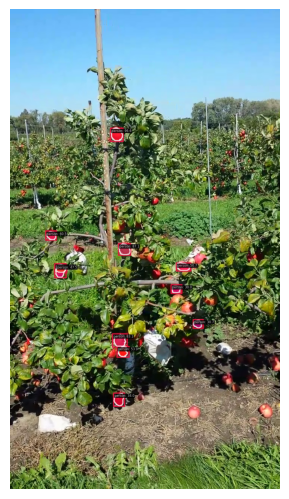

In [122]:
from mmengine.visualization import Visualizer
# get built visualizer
visualizer_now = Visualizer.get_current_instance()
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer_now.dataset_meta = model.dataset_meta
# show the results
visualizer_now.add_datasample(
    'new_result',
    img,
    data_sample=new_result,
    draw_gt=False,
    wait_time=0,
    out_file=None,
    pred_score_thr=0.1
)
visualizer_now.show()

In [123]:
path= '20150921_132038_image286.png'

im = mmcv.imread('/content/detection/train/images/'+path,channel_order='rgb')
masked = mmcv.imread('/content/detection/train/masks/'+ path,channel_order='rgb')
def draw_mask(image, mask_generated):
    masked_image = image.copy()

    # Convert BGR image to RGB if not in RGB format
    if image.shape[-1] == 3 and image.shape[-2] != 3:
        masked_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB)

    # Create a green mask on the specified areas
    mask = np.where(mask_generated.astype(int),
                    np.array([0, 255, 0], dtype='uint8'),
                    masked_image)

    # Convert the masked image to uint8
    masked_image = mask.astype(np.uint8)

    # Combine the original image and the masked image with a certain weight
    result = cv2.addWeighted(image, 0.3, masked_image, 0.7, 0)

    return result

Comparar con la imagen original con la mascara

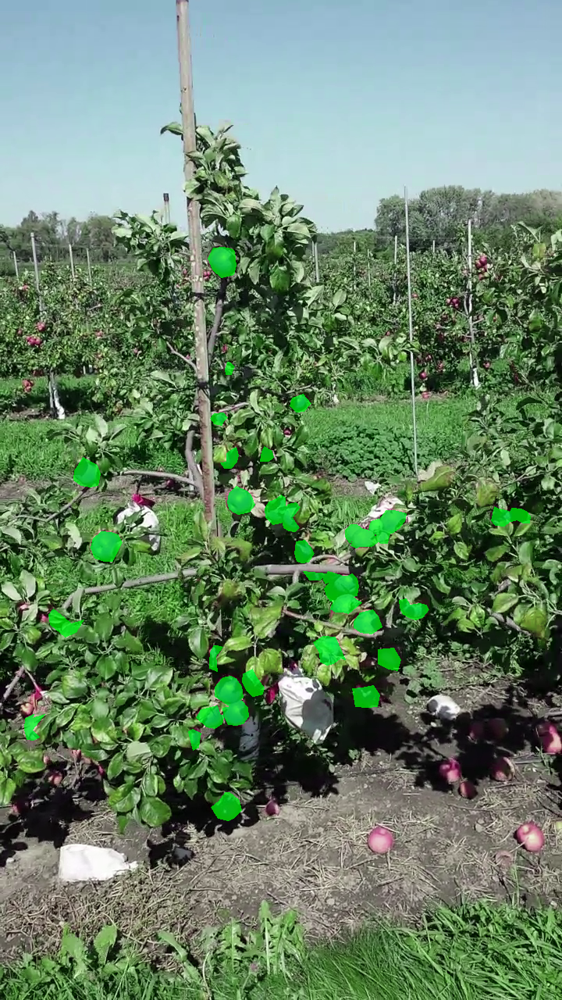

In [115]:
cv2_imshow(draw_mask(im,masked))

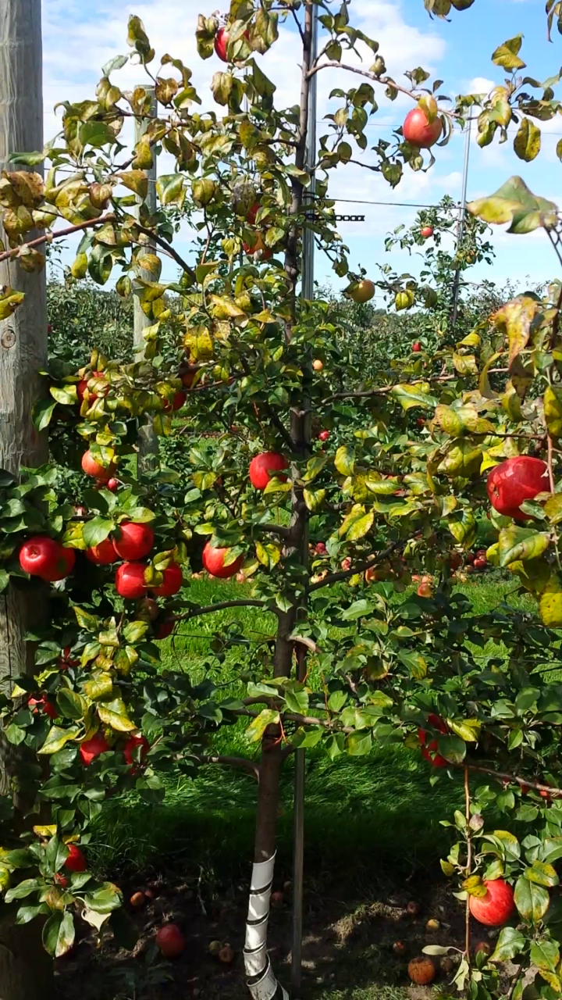

In [121]:
path= 'dataset1_front_1471.png'
im = mmcv.imread('/content/detection/test/images/'+path,channel_order='bgr')
cv2_imshow(im)